<a href="https://colab.research.google.com/github/BandhuG005/INSIGHT2_PRAGATI/blob/main/INSIGHT2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# ==============================================================================
# Step 1: Install and Import Necessary Libraries
# ==============================================================================
# Install system libraries required by OpenCV
!apt-get -qq update && apt-get -qq install -y ffmpeg libsm6 libxext6 libgl1-mesa-glx

# Install Python packages
!pip install -q ultralytics opencv-python-headless

import cv2
import numpy as np
from ultralytics import YOLO
import datetime
import os

# For displaying images and handling file uploads in Colab
from google.colab.patches import cv2_imshow
from google.colab import files

print("Setup Complete. Libraries are installed and imported.")


W: Skipping acquire of configured file 'main/source/Sources' as repository 'https://r2u.stat.illinois.edu/ubuntu jammy InRelease' does not seem to provide it (sources.list entry misspelt?)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 20.1 MB/s eta 0:00:00
Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Setup Complete. Libraries are installed and imported.


In [ ]:
# ==============================================================================
# Step 2: System Configuration
# ==============================================================================
# --- Model Path ---
MODEL_PATH = 'yolov8m.pt' # Medium model for a good balance of accuracy and speed
CONFIDENCE_THRESHOLD = 0.35 # Confidence for vehicle detection

# --- Signal Timing Logic Parameters (in seconds) ---
BASE_GREEN_TIME = 10      # Minimum green light duration
PER_PRIORITY_UNIT_TIME = 1.5 # Extra time added for each 'unit' of priority score
MAX_GREEN_TIME = 45       # Maximum allowable green light duration

# --- Vehicle Class Weights for Priority Scoring ---
VEHICLE_WEIGHTS = {
    'bus': 3.0,
    'truck': 2.5,
    'car': 1.0,
    'motorcycle': 0.5,
}

In [ ]:
# ==============================================================================
# Step 3: Main Analysis Logic for a Single Road Image
# ==============================================================================
def analyze_road_image(model, image_bytes, image_name):
    """
    Analyzes a single image of a road to determine its traffic priority score
    and returns the score, recommended green time, and an annotated image.
    """
    print(f"  -> Analyzing road: {image_name}...")

    # Convert image bytes to an OpenCV image
    nparr = np.frombuffer(image_bytes, np.uint8)
    frame = cv2.imdecode(nparr, cv2.IMREAD_COLOR)

    if frame is None:
        print(f"    ERROR: Failed to decode image {image_name}. Skipping.")
        return None

    annotated_frame = frame.copy()
    frame_height, frame_width, _ = frame.shape

    # --- Vehicle Detection ---
    results = model(frame, conf=CONFIDENCE_THRESHOLD, verbose=False)

    priority_score = 0.0
    vehicle_count = 0

    # --- Process Detections for Priority Scoring ---
    for result in results:
        for box in result.boxes:
            class_id = int(box.cls[0])
            class_name = model.names[class_id]

            if class_name in VEHICLE_WEIGHTS:
                vehicle_count += 1
                # 1. Add weighted score for vehicle type
                priority_score += VEHICLE_WEIGHTS[class_name]

                # 2. Add queue length bonus (vehicles further up the image get a higher bonus)
                x1, y1, x2, y2 = map(int, box.xyxy[0])
                normalized_y = y1 / frame_height
                priority_score += (1.0 - normalized_y) * 0.5 # Small bonus for being 'further back'

                # Draw bounding box on the vehicle
                cv2.rectangle(annotated_frame, (x1, y1), (x2, y2), (0, 255, 0), 2)

    # --- Calculate Recommended Green Light Duration ---
    green_time = BASE_GREEN_TIME + (priority_score * PER_PRIORITY_UNIT_TIME)
    recommended_duration = min(green_time, MAX_GREEN_TIME)

    print(f"    Done. Found {vehicle_count} vehicles. Priority Score: {priority_score:.2f}")

    # --- Add a data overlay to the annotated image ---
    overlay = annotated_frame.copy()
    cv2.rectangle(overlay, (5, 5), (450, 90), (0, 0, 0), -1)
    alpha = 0.6
    annotated_frame = cv2.addWeighted(overlay, alpha, annotated_frame, 1 - alpha, 0)
    cv2.putText(annotated_frame, f"Analysis for: {image_name}", (15, 35), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)
    cv2.putText(annotated_frame, f"Vehicle Count: {vehicle_count} | Priority Score: {priority_score:.2f}", (15, 70), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 255, 255), 2)

    return {
        "name": image_name,
        "priority_score": priority_score,
        "duration": recommended_duration,
        "annotated_image": annotated_frame,
        "vehicle_count": vehicle_count
    }


In [ ]:
# ==============================================================================
# Step 4: Generate a Professional Dashboard Image (NEW HACKATHON DESIGN)
# ==============================================================================
def create_hackathon_dashboard(analysis_results):
    """
    Generates a high-quality dashboard image displaying the full, prioritized
    signal cycle, perfect for a hackathon presentation.
    """
    # Sort roads by priority score for the cycle sequence
    sorted_roads = sorted(analysis_results, key=lambda x: x['priority_score'], reverse=True)

    # --- Dashboard Canvas Setup ---
    dashboard = np.full((800, 1200, 3), (18, 18, 18), dtype=np.uint8) # Dark theme
    green_color = (0, 204, 102)
    red_color = (255, 77, 77)

    # --- Header ---
    timestamp = datetime.datetime.now().strftime("%A, %d %B %Y | %I:%M:%S %p IST")
    cv2.putText(dashboard, "LIVE TRAFFIC ANALYSIS & SIGNAL CONTROL", (50, 70), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (255, 255, 255), 3)
    cv2.putText(dashboard, f"LOCATION: KOLKATA, WEST BENGAL, INDIA", (50, 110), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (200, 200, 200), 2)
    cv2.line(dashboard, (50, 140), (1150, 140), (50, 50, 50), 2)

    # --- Left Panel: Data & Justification ---
    cv2.putText(dashboard, "CURRENT ROAD ANALYSIS", (50, 200), cv2.FONT_HERSHEY_SIMPLEX, 1.1, (255, 255, 255), 2)

    # Table Header
    y_offset = 250
    cv2.putText(dashboard, "ROAD NAME", (60, y_offset), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (200, 200, 200), 2)
    cv2.putText(dashboard, "VEHICLES", (320, y_offset), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (200, 200, 200), 2)
    cv2.putText(dashboard, "PRIORITY", (480, y_offset), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (200, 200, 200), 2)
    cv2.line(dashboard, (50, y_offset + 15), (600, y_offset + 15), (50, 50, 50), 1)
    y_offset += 40

    # Table Rows
    for road in sorted_roads:
        cv2.putText(dashboard, road['name'], (60, y_offset), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 255, 255), 2)
        cv2.putText(dashboard, str(road['vehicle_count']), (340, y_offset), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 255, 255), 2)
        cv2.putText(dashboard, f"{road['priority_score']:.2f}", (490, y_offset), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 255, 255), 2)
        y_offset += 50

    # --- Right Panel: Proposed Signal Cycle Sequence ---
    cv2.putText(dashboard, "PROPOSED SIGNAL CYCLE", (650, 200), cv2.FONT_HERSHEY_SIMPLEX, 1.1, (255, 255, 255), 2)
    y_offset = 260

    for i, green_road in enumerate(sorted_roads):
        is_first = (i == 0)
        box_color = (40, 40, 40) if is_first else (25, 25, 25)

        # Draw panel for the cycle step
        cv2.rectangle(dashboard, (650, y_offset - 40), (1150, y_offset + 60), box_color, -1)
        if is_first:
             cv2.rectangle(dashboard, (645, y_offset - 40), (1155, y_offset + 60), green_color, 2)

        # Step Number
        step_text = f"STEP {i+1}" + (" (IMMEDIATE ACTION)" if is_first else "")
        cv2.putText(dashboard, step_text, (670, y_offset - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (200, 200, 200), 2)

        # Green Signal Info
        cv2.putText(dashboard, "GREEN:", (670, y_offset + 25), cv2.FONT_HERSHEY_SIMPLEX, 0.8, green_color, 2)
        cv2.putText(dashboard, green_road['name'], (780, y_offset + 25), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 255, 255), 2)
        cv2.putText(dashboard, f"({green_road['duration']:.1f}s)", (1020, y_offset + 25), cv2.FONT_HERSHEY_SIMPLEX, 0.8, green_color, 2)

        # Red Signals
        red_roads = [r['name'] for r in sorted_roads if r['name'] != green_road['name']]
        cv2.putText(dashboard, "RED:", (670, y_offset + 50), cv2.FONT_HERSHEY_SIMPLEX, 0.8, red_color, 2)
        cv2.putText(dashboard, ", ".join(red_roads), (780, y_offset + 50), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (200, 200, 200), 2)

        y_offset += 120

    return dashboard



Loading YOLOv8 model...
Model loaded successfully.

Please upload all traffic images for the intersection (2-4 images recommended).
Click 'Choose Files' below.


Saving lane3.png to lane3.png
Saving lane2.png to lane2.png
Saving lane1.png to lane1.png
Saving lane4.png to lane4.png

Starting analysis of all roads...
  -> Analyzing road: lane3.png...
    Done. Found 17 vehicles. Priority Score: 21.25
  -> Analyzing road: lane2.png...
    Done. Found 25 vehicles. Priority Score: 30.40
  -> Analyzing road: lane1.png...
    Done. Found 10 vehicles. Priority Score: 12.11
  -> Analyzing road: lane4.png...
    Done. Found 7 vehicles. Priority Score: 9.02


--- GENERATING HACKATHON DASHBOARD ---


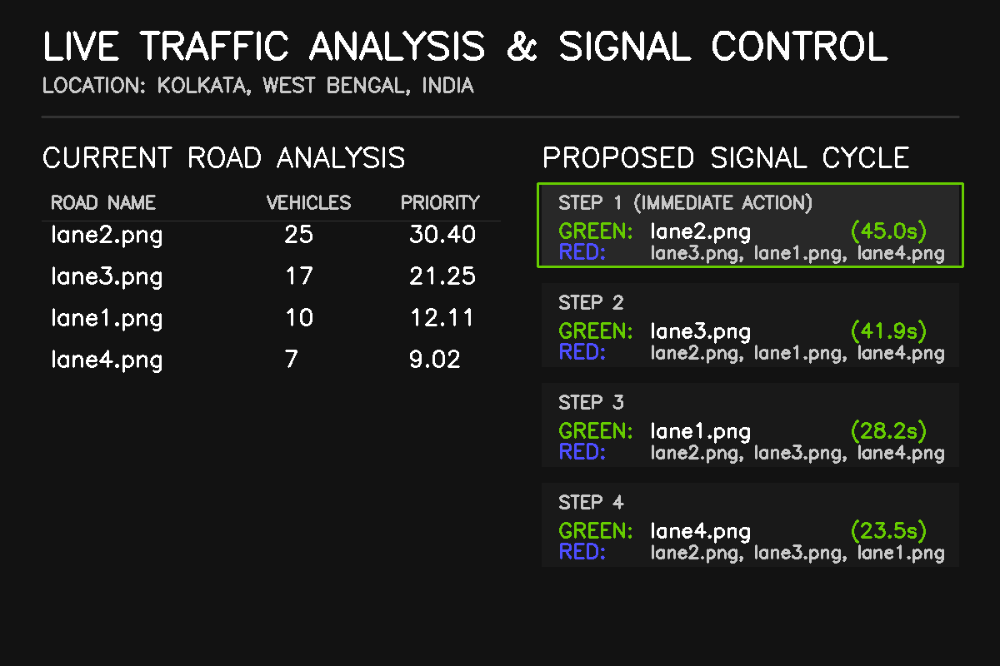



--- ANNOTATED IMAGES FOR EACH ROAD ---


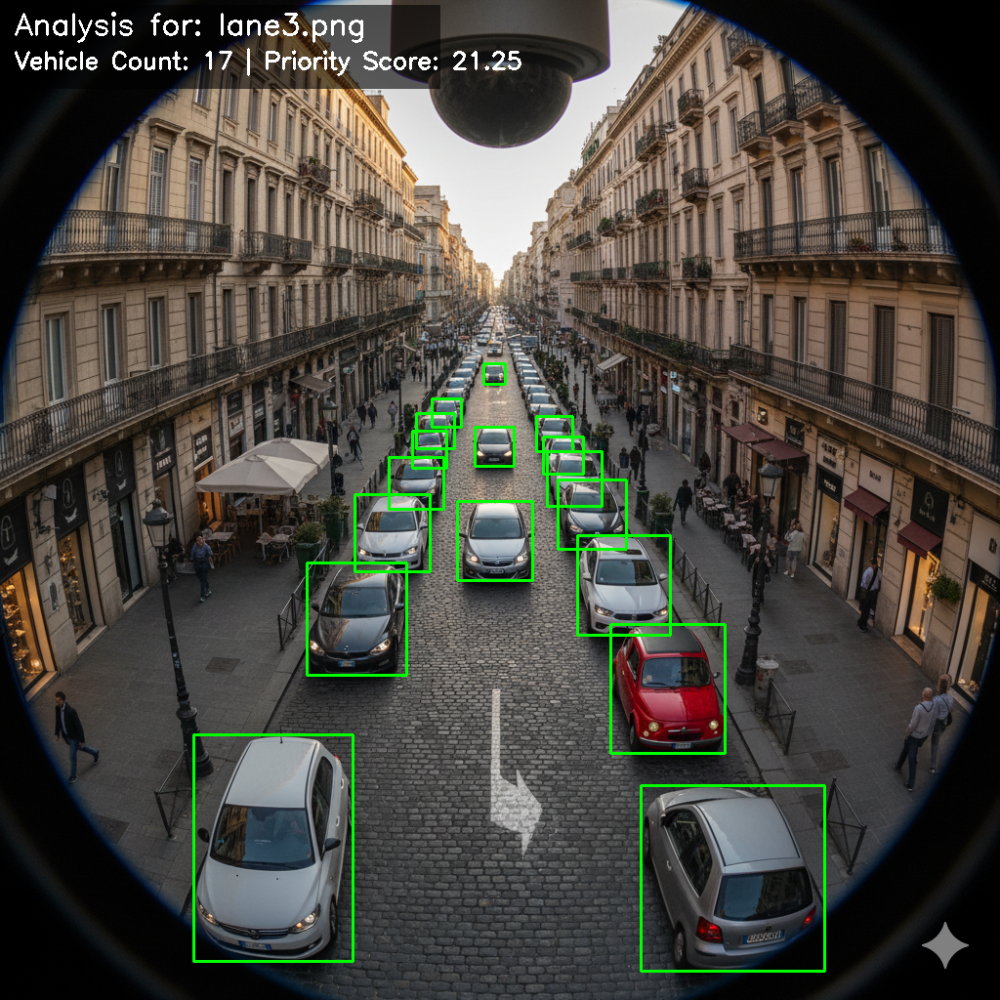

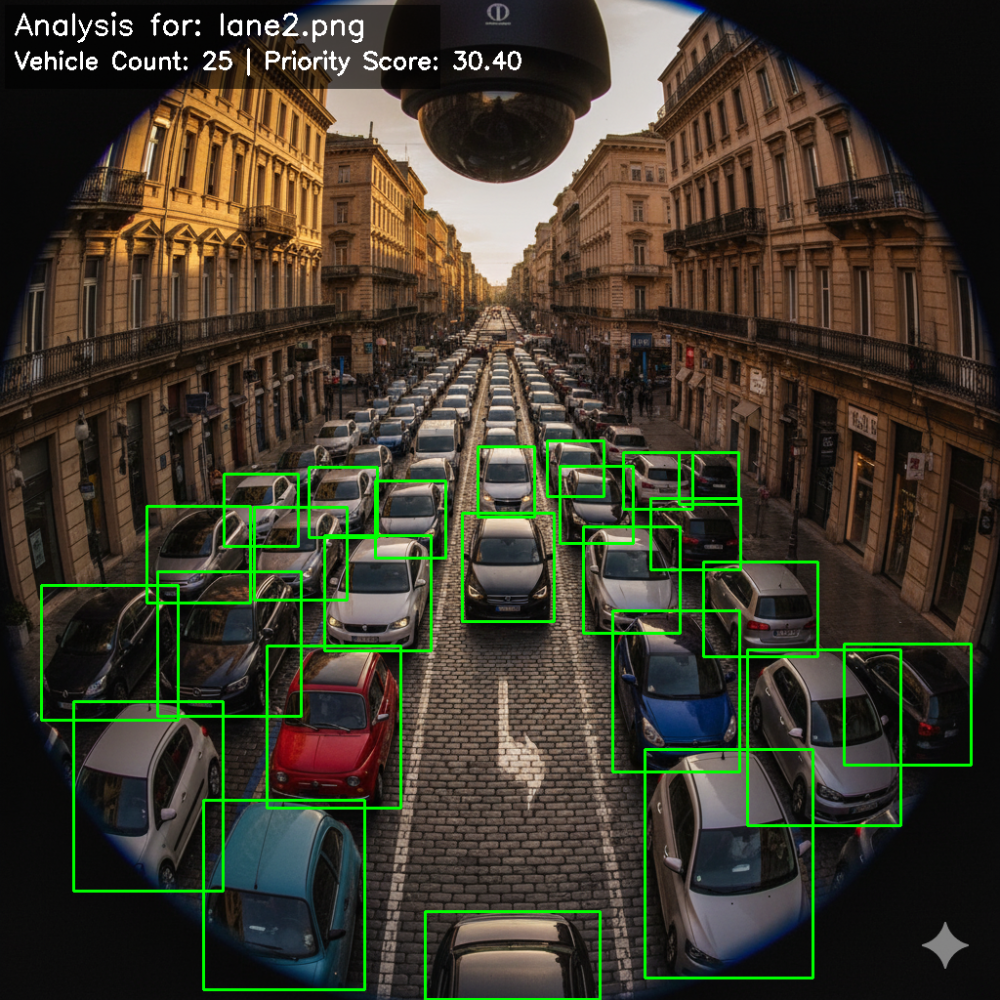

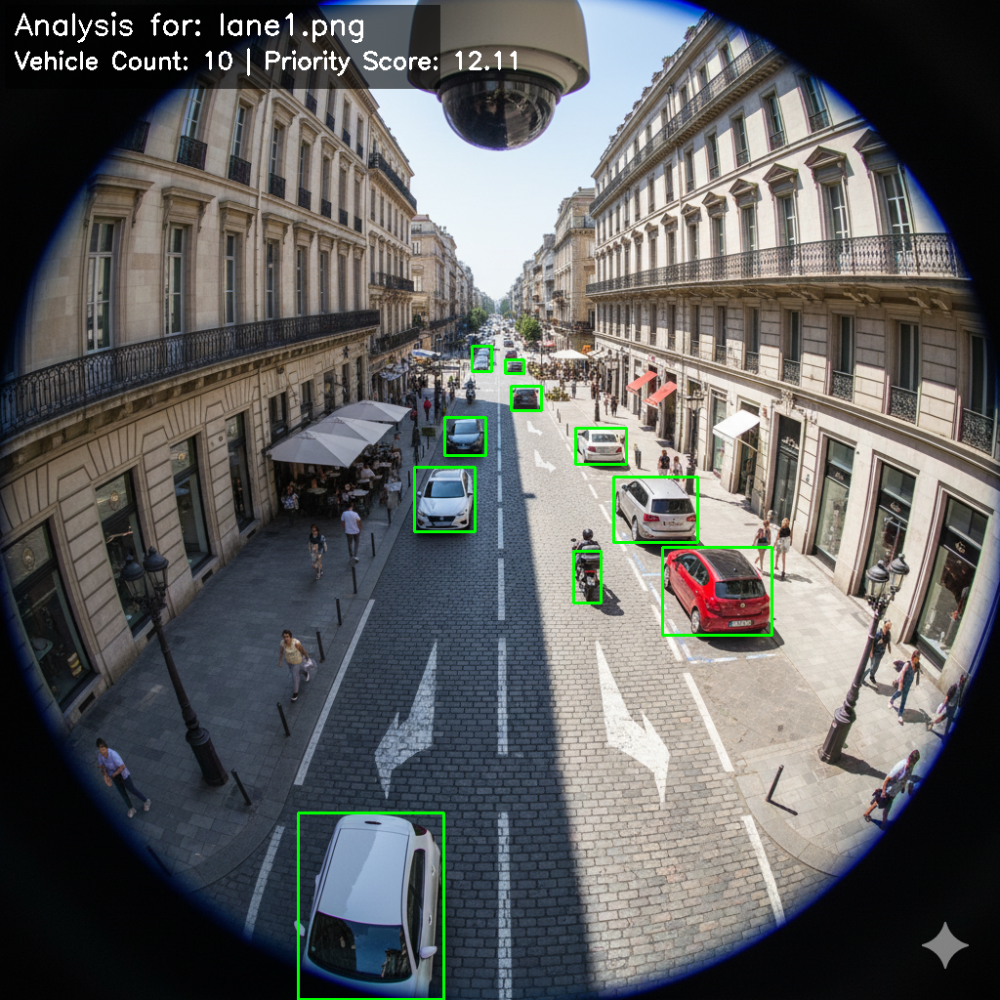

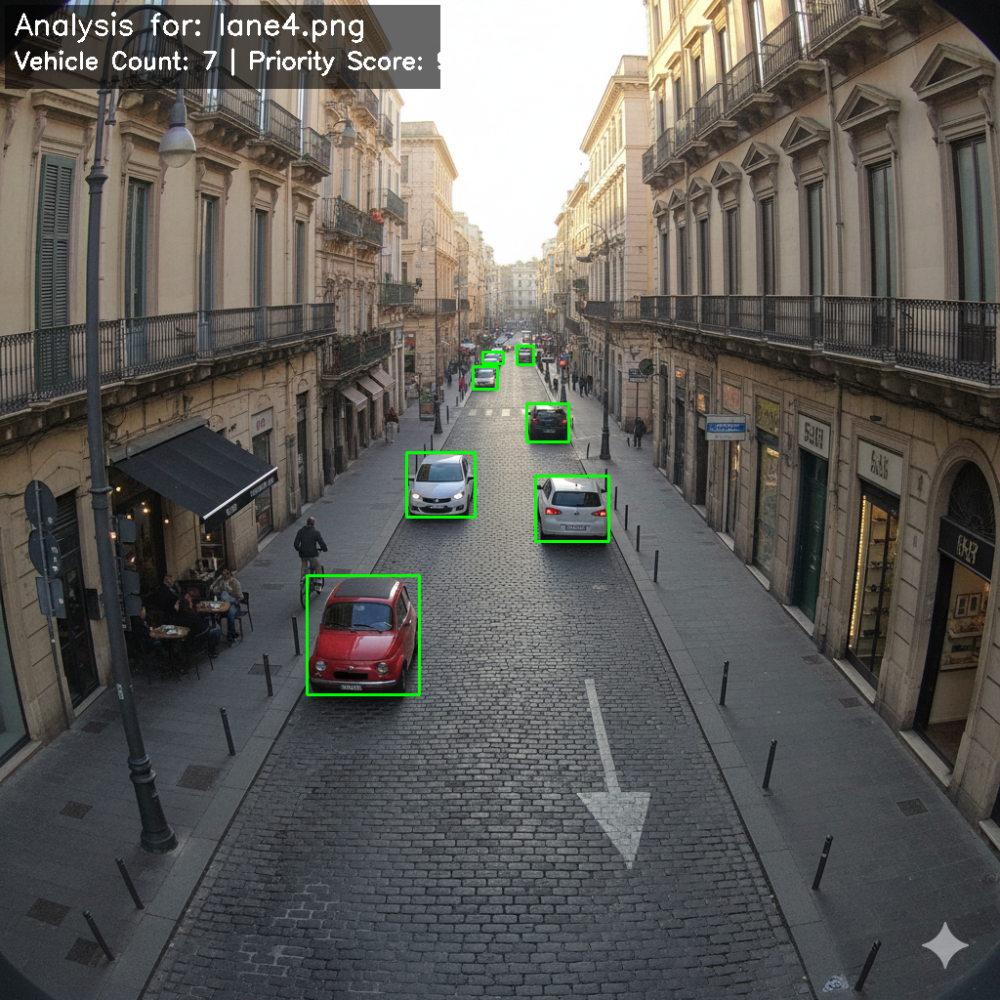


Would you like to analyze another intersection? (y/n): n
Exiting analysis session. Thank you!


In [ ]:
# ==============================================================================
# Step 5: Interactive Session Runner
# ==============================================================================
def run_intersection_analysis():
    # --- Model Loading ---
    print("\nLoading YOLOv8 model...")
    try:
        model = YOLO(MODEL_PATH)
        print("Model loaded successfully.")
    except Exception as e:
        print(f"Error loading model: {e}. Ensure internet connection for first download.")
        return

    while True:
        print("\n==================================================")
        print("Please upload all traffic images for the intersection (2-4 images recommended).")
        print("Click 'Choose Files' below.")

        uploaded = files.upload()

        if len(uploaded) < 2:
            print("ERROR: Please upload at least two images to analyze an intersection.")
            continue

        # --- Analyze each uploaded image ---
        print("\nStarting analysis of all roads...")
        analysis_results = []
        for image_name, image_bytes in uploaded.items():
            result = analyze_road_image(model, image_bytes, image_name)
            if result:
                analysis_results.append(result)

        if not analysis_results:
            print("Analysis failed for all images. Please try again.")
            continue

        # --- Generate and display the professional dashboard ---
        dashboard_image = create_hackathon_dashboard(analysis_results)
        print("\n\n--- GENERATING HACKATHON DASHBOARD ---")
        cv2_imshow(dashboard_image)

        # --- Display individual annotated images ---
        print("\n\n--- ANNOTATED IMAGES FOR EACH ROAD ---")
        for result in analysis_results:
             # Resize for consistent display if images are very large
            h, w, _ = result['annotated_image'].shape
            if w > 1000:
                new_w = 1000
                new_h = int(h * (new_w / w))
                display_img = cv2.resize(result['annotated_image'], (new_w, new_h))
            else:
                display_img = result['annotated_image']

            cv2_imshow(display_img)


        # Ask user if they want to continue
        print("\n==================================================")
        another = input("Would you like to analyze another intersection? (y/n): ").lower()
        if another not in ['y', 'yes']:
            print("Exiting analysis session. Thank you!")
            break

# ==============================================================================
# Step 6: Run the Analysis
# ==============================================================================
run_intersection_analysis()

